 <center> <h1> <b> Pattern Recognition and Machine Learning (EE5610 - EE2802 - AI2000 - AI5000) </b> </h1> </center>

<b> Programming Assignment - 05 : Dynamic Time Warping (DTW)  </b>


We expect you to code the dynamic time warping algorithm from scratch in this programming assignment. The skeleton code is provided for you to understand the algorithm. At the end of the assignment, you need to write an algorithm to perform an isolated digit recognition task using Dynamic Time Warping (DTW) codes. Isolated digit recognition is the task of recognizing the digit from the test speech signal having a single digit in isolation.

<b> Instructions </b>
1. Plagiarism is strictly prohibited.
2. Delayed submissions will be penalized with a scaling factor of 0.5 per day.
3. Please DO NOT use any machine learning libraries unless and otherwise specified.








<h4> <b> Part (a). Dynamic Time Warping(DTW): </b>  In this part you need to try and implement the basic sequence matching algorithm DTW. </h4>
<dt> <h4> Two sequences A and B can be compared using a euclidean distance
<center> $ A = (x_1, x_2, x_3, ..., x_M)$ </center> <br>
<center> $ B = (y_1, y_2, y_3, ..., y_N)$ </center> <br> </h4> </dt>
<dt> <h4> Now the distance is computed as </h4> </dt>
<center> $ D(A,B) = \frac{1}{N} \sum_1^N || x_n - y_n||$</center> </h4> </dt>
<dt> <h4> There are two main issues </h4> </dt>
<dd> <h4> 1. What if the sequences are not aligned in time ?</h4> </dt>
<dd> <h4> 2. What if the sequences have varying lengths ?</h4> </dt>
<dt> <h4> The non-linear alignment path produces a better similarity measure. </h4> </dt>

![picture](https://drive.google.com/uc?export=view&id=1XWTK0XUpDIuf-5nbe7pk6uPx29-22zF0)

<dt> <h4> <b> Algorithm </b> </h4> </dt>
<dt> <h4>  1. Compute distance matrix $D_{M\times N}$ between A and B </h4> </dt>
<dt> <h4>  2. Compute accumulated distance matrix $C_{M\times N}$ between A and B </h4> </dt>
<dd> <h4>  ~ Initialize: C(0,0) = D(0,0) </h4> </dd>
<dd> <h4>  ~ for i=1,2,..M and j=1,2,...N  <dd> <h4>  ~ Update C <dd> <h4> C(i,j) = D(i,j) + min {C(i−1, j−1), C(i, j−1), C(i−1, j)} </h4> </dd> </h4> </dd> <dd> <h4>  ~ Store the best Path <dd> <h4> P(i,j) = arg min {C(i−1, j−1), C(i, j−1), C(i−1, j)} </h4> </dd> </h4> </dd> </h4> </dd>
<dt> <h4>  3. C(M,N) gives the similarity measure </h4> </dt>
<dt> <h4>  4. Backtrack the best alignment path <br> <center> $ q_T^* = (M,N) \\ q_{t-1}^* = P(q_t^*) \qquad t = T,T-1,....1$ </center></h4> </dt>
<dt> <h4> <b> Programming question </b> </h4> </dt>
<dt> <h4>  1. Consider the following two sequences $A = [4,3,7,0,2,6,5]$, and $B = [3,7,1,6,1,5,4,4]$. Write a DTW algorithm to find the optimal similarity/distance between them. </h4> </dt>
<dd> <h4> - Compute the distance matrix between the two sequences </dd> </h4>
<dd> <h4> - Compute the accumulative distance matrix </dd> </h4>
<dd> <h4> - Backtrack from the accumulative distance matrix to get the optimal path and thereby compute the optimal distance </dd> </h4>
<dd> <h4> - Plot the optimal path on both the distance matrix and cumulative distance matrix to verify the DTW codes </dd> </h4>



Optimal Distance:
9.0


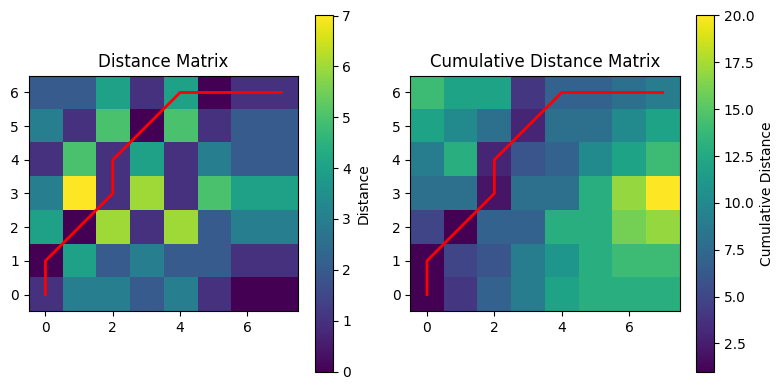

In [ ]:
#All imports
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import collections

###########################################################
#Function to obtain the optimal distance and path between two sequences
###########################################################
def DTW(sequence1,sequence2):
    #######################################################
    # Input  : Two sequences
    # Output : DTW path and optimal distance
    #######################################################

    template1 = sequence1
    template2 = sequence2

    #######################################################
    # Code snippet to create the cumulative distance matrix
    #######################################################

    DTW_distance_Matrix = np.empty((len(template1), len(template2)))

    # Initialize the cumulative distance matrix
    DTW_cumulate_Matrix = np.empty((len(template1), len(template2)))   #Cummulative distance matrix
    DTW_cumulate_Matrix[0, 0] = np.abs(sequence1[0] - sequence2[0])
    DTW_distance_Matrix[0, 0] = np.abs(sequence1[0] - sequence2[0])

    for i in range(1, len(sequence1)):
        DTW_cumulate_Matrix[i, 0] = DTW_cumulate_Matrix[i-1, 0] + np.abs(sequence1[i] - sequence2[0])
        DTW_distance_Matrix[i, 0] = np.abs(sequence1[i] - sequence2[0])
    for i in range(1, len(sequence2)):
        DTW_cumulate_Matrix[0, i] = DTW_cumulate_Matrix[0, i-1] + np.abs(sequence2[i] - sequence1[0])
        DTW_distance_Matrix[0, i] = np.abs(sequence2[i] - sequence1[0])

    def get_min_index(i, j, DTW_cumulate_Matrix):
        # Get the indices of the three neighboring elements
        indices = [(i - 1, j), (i - 1, j - 1), (i, j - 1)]

        # Calculate the indices of the smallest value
        min_index = indices[np.argmin([DTW_cumulate_Matrix[idx] for idx in indices])]

        return min_index


    optimal_indices = []
    #Iterate through the sequence of points in sequences and compute the distance between the sequences.
    for i in range(1,len(template1),1): #you can start from 1
        for j in range(1,len(template2),1):
            current_distance = np.abs(sequence1[i] - sequence2[j])     #Compute the distance between the two points

            DTW_cumulate_Matrix[i, j] = min(DTW_cumulate_Matrix[i-1,j],DTW_cumulate_Matrix[i-1,j-1],DTW_cumulate_Matrix[i,j-1]) + current_distance
            DTW_distance_Matrix[i, j] = current_distance


    #######################################################
    # Code snippet to find the optimal DTW path and the corresponding optimal distance
    #######################################################

    i = len(template1) - 1 # length of the sequence1
    j = len(template2) - 1 # length of the sequence2
    opt_distance = DTW_cumulate_Matrix[i, j]

    optimal_indices = []
    optimal_indices.append([i, j])
    while i!=0 and j!=0: #Start from the last point and backtrack
        #Get the indexes (i,j) of the small value among (DTW_cumulate_Matrix[i-1,j], DTW_cumulate_Matrix[i-1,j-1], DTW_cumulate_Matrix[i,j-1])
        i, j = get_min_index(i, j, DTW_cumulate_Matrix)

        min_index = [i, j]

        optimal_indices.append(min_index)
    while i != 0:
        i = i-1

        min_index = [i, j]

        optimal_indices.append(min_index)
        if i == 0:
            break

    while j != 0:
        j = j-1

        min_index = [i, j]

        optimal_indices.append(min_index)
        if j == 0:
            break


    optimal_indices = optimal_indices[::-1]
    optimal_indices = np.array(optimal_indices)
    #######################################################
    # Return optimal distance and optimal dtw path
    #######################################################
    return opt_distance, optimal_indices, DTW_distance_Matrix, DTW_cumulate_Matrix



def plotDTWpath(sequence1,sequence2):
    #######################################################
    # Inputs : sequence1 and sequence2
    # Outputs : plot of optimal path on distance matrix and cumulative distance matrix
    #######################################################
    opt_distance, optimal_indices, distance_matrix, cumulative_distance_matrix = DTW(sequence1,sequence2)

    print("Optimal Distance:")
    print(opt_distance)

    # Plot the distance matrix
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(distance_matrix, cmap='viridis', origin='lower', interpolation='nearest')
    plt.title('Distance Matrix')
    plt.colorbar(label='Distance')

    plt.plot(optimal_indices[:, 1], optimal_indices[:, 0], 'r-', linewidth=2)

    # Plot the cumulative distance matrix
    plt.subplot(1, 2, 2)
    plt.imshow(cumulative_distance_matrix, cmap='viridis', origin='lower', interpolation='nearest')
    plt.title('Cumulative Distance Matrix')
    plt.colorbar(label='Cumulative Distance')

    # Plot the optimal path
    # Here, you should plot the optimal path on both distance and cumulative distance matrices
    # You can use plt.plot(x, y, 'r-', linewidth=2) to plot a red line between points with coordinates (x, y)

    plt.plot(optimal_indices[:, 1], optimal_indices[:, 0], 'r-', linewidth=2)

    # Set labels and show plot
    plt.tight_layout()
    plt.show()

A=[4,3,7,0,2,6,5]
B=[3,7,1,6,1,5,4,4]

plotDTWpath(A, B)

<b> Report your observations </b>

1. Given algorithm travels along the path which gives the least cumulative distance. This is calculated using a dynamic programming algorithm. This provides the effect of time warping

2. Cumulative distance image values are more continuous compared to the distance image values. This is due to consideration of effect of neighbouring points on the current point in the cumulative distance matrix




<dt> <h4> <b> Part (b): </b> In this part of the assignment, we expect you to build the Isolated digit recognition system with the help of the above written DTW algorithm. </dt> </h4>

![picture](https://drive.google.com/uc?export=view&id=1nGtWwbDg8PJBNwck_dUt2mmsCBshrGYc)



<dt> <h4> 1. Record one repetition each of the digits zero, one, two, three, four, five, six, seven, eight, and nine. The modules to record the voice in online mode are provided here. If you are not comfortable using the online recording modules, you can record the digits offline and access them in google colab through proper codes. </dt> </h4>
<dt> <h4> 2. Record three further repetitions of the same digits (Isolated words) as test data. </dt> </h4>  
<dt> <h4> 3. The codes to compute the signal's templates (Mel Frequency Cepstral Coefficients) are provided. Please use them to obtain the templates of the speech signals. </dt> </h4>  
<dt> <h4> 4. Write an algorithm to perform isolated digit recognition with the help of the DTW codes. </dt> </h4>
<dt> <h4> 5. Take two pairs such that one pair is the repetition of the same digit and another one is two different digits. Plot the optimal DTW path on distance and cumulative distance matrices for both cases.   </dt> </h4>
<dt> <h4> 6. Evaluate the digit recognition accuracy, i.e., the percentage of correctly recognized trials out of each digit's total number of attempts. </dt> </h4>
<dt> <h4> 7. Create a confusion matrix and report the most confusing digits. </dt> </h4>


**Module to record the voice in online mode**

In [ ]:
from IPython.display import Javascript
from google.colab import output
from base64 import b64decode
from io import BytesIO
!pip -q install pydub
from pydub import AudioSegment

RECORD = """
const sleep  = time => new Promise(resolve => setTimeout(resolve, time))
const b2text = blob => new Promise(resolve => {
  const reader = new FileReader()
  reader.onloadend = e => resolve(e.srcElement.result)
  reader.readAsDataURL(blob)
})
var record = time => new Promise(async resolve => {
  stream = await navigator.mediaDevices.getUserMedia({ audio: true })
  recorder = new MediaRecorder(stream)
  chunks = []
  recorder.ondataavailable = e => chunks.push(e.data)
  recorder.start()
  await sleep(time)
  recorder.onstop = async ()=>{
    blob = new Blob(chunks)
    text = await b2text(blob)
    resolve(text)
  }
  recorder.stop()
})
"""

def record(sec=3):
  display(Javascript(RECORD))
  s = output.eval_js('record(%d)' % (sec*1000))
  b = b64decode(s.split(',')[1])
  audio = AudioSegment.from_file(BytesIO(b))
  return audio

In [ ]:
from matplotlib import pyplot as plt
import numpy as np
import scipy.io.wavfile
import io
import os
from IPython.display import Audio

# Example loop to record multiple audio clips
for i in range(40):  # Change 5 to however many recordings you want
    # Optional: Remove existing recording.wav
    if os.path.isfile('recording.wav'):
        os.remove('recording.wav')
        print("Removed existing recording.wav")

    print(f"Recording {i+1}")
    wav = record(3.0)  # It will record three seconds of your speech. You can change the duration.
    wav = wav.set_frame_rate(16000)
    sig = wav.get_array_of_samples()
    samples = np.array(sig).T.astype(np.float32)
    fp_arr = np.array(samples).T.astype(np.float32)
    fp_arr /= np.iinfo(sig.typecode).max
    filename = f"recording_{i}.wav"  # Change filename for each recording
    scipy.io.wavfile.write(filename, 16000, fp_arr)
    print(f"Saved recording as {filename}")

    # Optional: Display the audio
    wn = Audio(filename, autoplay=True)
    display(wn)


Recording 1


<IPython.core.display.Javascript object>

Saved recording as recording_0.wav


Recording 2


<IPython.core.display.Javascript object>

Saved recording as recording_1.wav


Recording 3


<IPython.core.display.Javascript object>

Saved recording as recording_2.wav


Recording 4


<IPython.core.display.Javascript object>

Saved recording as recording_3.wav


Recording 5


<IPython.core.display.Javascript object>

Saved recording as recording_4.wav


Recording 6


<IPython.core.display.Javascript object>

Saved recording as recording_5.wav


Recording 7


<IPython.core.display.Javascript object>

Saved recording as recording_6.wav


Recording 8


<IPython.core.display.Javascript object>

Saved recording as recording_7.wav


Recording 9


<IPython.core.display.Javascript object>

Saved recording as recording_8.wav


Recording 10


<IPython.core.display.Javascript object>

Saved recording as recording_9.wav


Recording 11


<IPython.core.display.Javascript object>

Saved recording as recording_10.wav


Recording 12


<IPython.core.display.Javascript object>

Saved recording as recording_11.wav


Recording 13


<IPython.core.display.Javascript object>

Saved recording as recording_12.wav


Recording 14


<IPython.core.display.Javascript object>

Saved recording as recording_13.wav


Recording 15


<IPython.core.display.Javascript object>

Saved recording as recording_14.wav


Recording 16


<IPython.core.display.Javascript object>

Saved recording as recording_15.wav


Recording 17


<IPython.core.display.Javascript object>

Saved recording as recording_16.wav


Recording 18


<IPython.core.display.Javascript object>

Saved recording as recording_17.wav


Recording 19


<IPython.core.display.Javascript object>

Saved recording as recording_18.wav


Recording 20


<IPython.core.display.Javascript object>

Saved recording as recording_19.wav


Recording 21


<IPython.core.display.Javascript object>

Saved recording as recording_20.wav


Recording 22


<IPython.core.display.Javascript object>

Saved recording as recording_21.wav


Recording 23


<IPython.core.display.Javascript object>

Saved recording as recording_22.wav


Recording 24


<IPython.core.display.Javascript object>

Saved recording as recording_23.wav


Recording 25


<IPython.core.display.Javascript object>

Saved recording as recording_24.wav


Recording 26


<IPython.core.display.Javascript object>

Saved recording as recording_25.wav


Recording 27


<IPython.core.display.Javascript object>

Saved recording as recording_26.wav


Recording 28


<IPython.core.display.Javascript object>

Saved recording as recording_27.wav


Recording 29


<IPython.core.display.Javascript object>

Saved recording as recording_28.wav


Recording 30


<IPython.core.display.Javascript object>

Saved recording as recording_29.wav


Recording 31


<IPython.core.display.Javascript object>

Saved recording as recording_30.wav


Recording 32


<IPython.core.display.Javascript object>

Saved recording as recording_31.wav


Recording 33


<IPython.core.display.Javascript object>

Saved recording as recording_32.wav


Recording 34


<IPython.core.display.Javascript object>

Saved recording as recording_33.wav


Recording 35


<IPython.core.display.Javascript object>

Saved recording as recording_34.wav


Recording 36


<IPython.core.display.Javascript object>

Saved recording as recording_35.wav


Recording 37


<IPython.core.display.Javascript object>

Saved recording as recording_36.wav


Recording 38


<IPython.core.display.Javascript object>

Saved recording as recording_37.wav


Recording 39


<IPython.core.display.Javascript object>

Saved recording as recording_38.wav


Recording 40


<IPython.core.display.Javascript object>

Saved recording as recording_39.wav


**Algorithm to perform isolated digit recognition**

In [ ]:
import scipy.io.wavfile as wav
!pip -q install python_speech_features
!pip -q install speechpy
from python_speech_features import mfcc
import speechpy

train_data = []
test_data = []

for i in range(40):
    (rate,sig) = wav.read(f"recording_{i}.wav")
    sig=sig-np.mean(sig)
    mfcc_feat=mfcc(sig,rate,numcep=13,winlen=0.025,winstep=0.01,nfilt=40,lowfreq=20,highfreq=4000,winfunc=np.hamming)
    mfcc_feat_cmvn=speechpy.processing.cmvnw(mfcc_feat,win_size=301,variance_normalization=False)
    data = np.array(mfcc_feat_cmvn)
    if i%4 == 0:
        train_data.append(data)
    else:
        test_data.append(data)

  Preparing metadata (setup.py) ... done


**Plot the optimal DTW path**

In [ ]:
#All imports
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import collections

def distance_calc(x, y):
    '''print("d")
    print(x.shape)
    print(y.shape)'''
    return np.sum(np.abs(x-y))

###########################################################
#Function to obtain the optimal distance and path between two sequences
###########################################################
def DTW(sequence1,sequence2):
    #######################################################
    # Input  : Two sequences
    # Output : DTW path and optimal distance
    #######################################################

    template1 = sequence1
    template2 = sequence2

    #######################################################
    # Code snippet to create the cumulative distance matrix
    #######################################################

    DTW_distance_Matrix = np.empty((len(template1), len(template2)))

    # Initialize the cumulative distance matrix
    DTW_cumulate_Matrix = np.empty((len(template1), len(template2)))   #Cummulative distance matrix
    DTW_cumulate_Matrix[0, 0] = distance_calc(sequence1[0], sequence2[0])
    DTW_distance_Matrix[0, 0] = distance_calc(sequence1[0], sequence2[0])

    for i in range(1, len(sequence1)):
        DTW_cumulate_Matrix[i, 0] = DTW_cumulate_Matrix[i-1, 0] + distance_calc(sequence1[i], sequence2[0])
        DTW_distance_Matrix[i, 0] = distance_calc(sequence1[i], sequence2[0])
    for i in range(1, len(sequence2)):
        DTW_cumulate_Matrix[0, i] = DTW_cumulate_Matrix[0, i-1] + distance_calc(sequence2[i], sequence1[0])
        DTW_distance_Matrix[0, i] = distance_calc(sequence2[i], sequence1[0])

    def get_min_index(i, j, DTW_cumulate_Matrix):
        # Get the indices of the three neighboring elements
        indices = [(i - 1, j), (i - 1, j - 1), (i, j - 1)]

        # Calculate the indices of the smallest value
        min_index = indices[np.argmin([DTW_cumulate_Matrix[idx] for idx in indices])]

        return min_index


    optimal_indices = []
    #Iterate through the sequence of points in sequences and compute the distance between the sequences.
    for i in range(1,len(template1),1): #you can start from 1
        for j in range(1,len(template2),1):
            current_distance = distance_calc(sequence1[i], sequence2[j])     #Compute the distance between the two points

            DTW_cumulate_Matrix[i, j] = min(DTW_cumulate_Matrix[i-1,j],DTW_cumulate_Matrix[i-1,j-1],DTW_cumulate_Matrix[i,j-1]) + current_distance
            DTW_distance_Matrix[i, j] = current_distance


    #######################################################
    # Code snippet to find the optimal DTW path and the corresponding optimal distance
    #######################################################

    i = len(template1) - 1 # length of the sequence1
    j = len(template2) - 1 # length of the sequence2
    opt_distance = DTW_cumulate_Matrix[i, j]

    optimal_indices = []
    optimal_indices.append([i, j])
    while i!=0 and j!=0: #Start from the last point and backtrack
        #Get the indexes (i,j) of the small value among (DTW_cumulate_Matrix[i-1,j], DTW_cumulate_Matrix[i-1,j-1], DTW_cumulate_Matrix[i,j-1])
        i, j = get_min_index(i, j, DTW_cumulate_Matrix)

        min_index = [i, j]

        optimal_indices.append(min_index)
    while i != 0:
        i = i-1

        min_index = [i, j]

        optimal_indices.append(min_index)
        if i == 0:
            break

    while j != 0:
        j = j-1

        min_index = [i, j]

        optimal_indices.append(min_index)
        if j == 0:
            break


    optimal_indices = optimal_indices[::-1]
    optimal_indices = np.array(optimal_indices)
    #######################################################
    # Return optimal distance and optimal dtw path
    #######################################################
    return opt_distance, optimal_indices, DTW_distance_Matrix, DTW_cumulate_Matrix



def plotDTWpath(sequence1,sequence2):
    #######################################################
    # Inputs : sequence1 and sequence2
    # Outputs : plot of optimal path on distance matrix and cumulative distance matrix
    #######################################################
    opt_distance, optimal_indices, distance_matrix, cumulative_distance_matrix = DTW(sequence1,sequence2)

    print("Optimal Distance:")
    print(opt_distance)

    # Plot the distance matrix
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(distance_matrix, cmap='viridis', origin='lower', interpolation='nearest')
    plt.title('Distance Matrix')
    plt.colorbar(label='Distance')

    plt.plot(optimal_indices[:, 1], optimal_indices[:, 0], 'r-', linewidth=2)

    # Plot the cumulative distance matrix
    plt.subplot(1, 2, 2)
    plt.imshow(cumulative_distance_matrix, cmap='viridis', origin='lower', interpolation='nearest')
    plt.title('Cumulative Distance Matrix')
    plt.colorbar(label='Cumulative Distance')

    # Plot the optimal path
    # Here, you should plot the optimal path on both distance and cumulative distance matrices
    # You can use plt.plot(x, y, 'r-', linewidth=2) to plot a red line between points with coordinates (x, y)

    plt.plot(optimal_indices[:, 1], optimal_indices[:, 0], 'r-', linewidth=2)

    # Set labels and show plot
    plt.tight_layout()
    plt.show()


Optimal Distance:
38933.241386413574


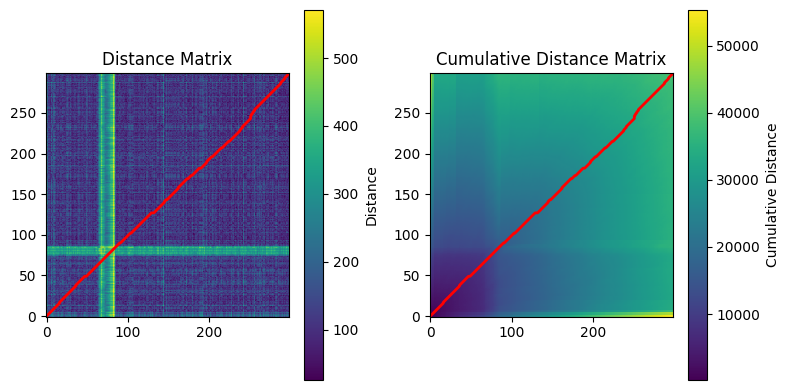

Optimal Distance:
44886.86264038086


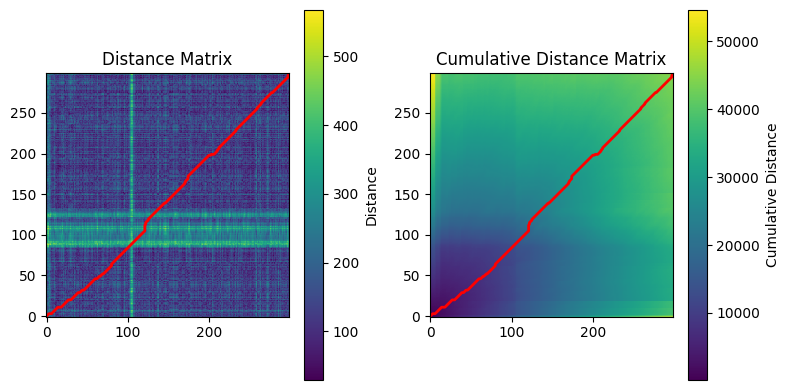

In [ ]:
#All imports
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import collections

# Same Number
print("Two 4 recordings")
plotDTWpath(train_data[4], test_data[9])

# Different Number
print("Comparison of 9 and zero")
plotDTWpath(train_data[9], test_data[2])

**Compute the required metrics ( digit recognition accuracy ) and illustrations ( confusion matrix )**

In [ ]:
import math

true_labels = []

for i in range(len(test_data)):
    true_labels.append(math.floor(i/3))

outputs = []
c=0
for test in test_data:
    '''print("Testing")
    print(c)'''
    min_distance = DTW(test, train_data[0])[0]
    output = 0
    for i in range(1, len(train_data)):
        curr_distance = DTW(test, train_data[i])[0]
        if(min_distance > curr_distance):
            min_distance = curr_distance
            output = i
    #plotDTWpath(test, train_data_j[output])
    outputs.append(output)
    c += 1

confusion_matrix = np.zeros((10, 10))

for i in range(len(true_labels)):
    confusion_matrix[true_labels[i], outputs[i]] += 1

confusion_matrix /= len(true_labels)
confusion_matrix = np.round_(confusion_matrix, decimals = 3)

outputs = np.array(outputs)
true_labels = np.array(true_labels)

print("Predictions:")
print(outputs)
print("True Values:")
print(true_labels)
print("Accuracy:")
Acc = np.mean(outputs == true_labels) * 100
print(Acc)
print("Confusion Matrix:")
print(confusion_matrix)

Predictions:
[2 2 2 2 2 4 4 2 4 3 2 2 4 4 4 2 4 2 2 6 6 7 7 2 2 8 8 9 9 2]
True Values:
[0 0 0 1 1 1 2 2 2 3 3 3 4 4 4 5 5 5 6 6 6 7 7 7 8 8 8 9 9 9]
Accuracy:
43.333333333333336
Confusion Matrix:
[[0.    0.    0.1   0.    0.    0.    0.    0.    0.    0.   ]
 [0.    0.    0.067 0.    0.033 0.    0.    0.    0.    0.   ]
 [0.    0.    0.033 0.    0.067 0.    0.    0.    0.    0.   ]
 [0.    0.    0.067 0.033 0.    0.    0.    0.    0.    0.   ]
 [0.    0.    0.    0.    0.1   0.    0.    0.    0.    0.   ]
 [0.    0.    0.067 0.    0.033 0.    0.    0.    0.    0.   ]
 [0.    0.    0.033 0.    0.    0.    0.067 0.    0.    0.   ]
 [0.    0.    0.033 0.    0.    0.    0.    0.067 0.    0.   ]
 [0.    0.    0.033 0.    0.    0.    0.    0.    0.067 0.   ]
 [0.    0.    0.033 0.    0.    0.    0.    0.    0.    0.067]]


<b> Report your observations </b>

1. Accuracy for this model depends a lot on the clarity of the data. If the data is noisy, the accuracy is much lower. Recordings where the sound is clear gives rise to better accuracy, as observed from the given recordings

2. In the above, the train data for 2 was quite feeble. Hence a lot of the other test data which was feeble were classified as 2.

3. From the plots, it is clear the cumulative distances for same number is less than for different numbers. This provides the basis for classification




<dt> <h4> <b> Part (c): </b> In this part of the assignment, we expect you to evaluate the above-written digit recognition system performance on different test cases and understand the pros and cons of the DTW algorithm.  </dt> </h4>

[link to TDIGITS data](https://drive.google.com/drive/folders/1oV3jrUiug0-SwWLOdLtbXA6hzqYYIlI7?usp=sharing)


<dt> <h4> 1. Evaluate the performance of digit recognition systems on the TDGIT database shared with you and report the accuracy. </dt> </h4>
<dt> <h4> 2. Evaluate the performance in different cases, i.e., a pair of templates with the same speaker and a different speaker. </dt> </h4>
<dt> <h4> 3. Please report some of the changes to improve the system performance. </dt> </h4>

In [ ]:
#All imports
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import math
import matplotlib.pyplot as plt
import collections
import scipy.io.wavfile as wav
!pip -q install python_speech_features
!pip -q install speechpy
from python_speech_features import mfcc
import speechpy

  Preparing metadata (setup.py) ... done


In [ ]:
#Performance evaluation of Isolated digit recognition system on TDIGITS data

train_data_j = []
test_data_j = []
train_data_n = []
test_data_n = []

for i in range(100):
    num = math.floor(i/10)
    ind = i % 10
    (rate,sig) = wav.read(f"{num}_jackson_{ind}.wav")
    sig=sig-np.mean(sig)
    mfcc_feat=mfcc(sig,rate,numcep=13,winlen=0.025,winstep=0.01,nfilt=40,lowfreq=20,highfreq=4000,winfunc=np.hamming)
    mfcc_feat_cmvn=speechpy.processing.cmvnw(mfcc_feat,win_size=301,variance_normalization=False)
    data = np.array(mfcc_feat_cmvn)
    #print(data.shape)
    if i%10 == 0:
        train_data_j.append(data)
    else:
        test_data_j.append(data)

for i in range(100):
    num = math.floor(i/10)
    ind = i % 10
    (rate,sig) = wav.read(f"{num}_nicolas_{ind}.wav")
    sig=sig-np.mean(sig)
    mfcc_feat=mfcc(sig,rate,numcep=13,winlen=0.025,winstep=0.01,nfilt=40,lowfreq=20,highfreq=4000,winfunc=np.hamming)
    mfcc_feat_cmvn=speechpy.processing.cmvnw(mfcc_feat,win_size=301,variance_normalization=False)
    data = np.array(mfcc_feat_cmvn)
    #print(data.shape)
    if i%10 == 0:
        train_data_n.append(data)
    else:
        test_data_n.append(data)


#Performance evaluation of Isolated digit recognition system on TDIGITS data, with the reference and test signal coming from the same speaker

print(len(train_data_j))

true_labels = []

for i in range(len(test_data_j)):
    true_labels.append(math.floor(i/9))

outputs = []
c=0
for test in test_data_j:
    '''print("Testing")
    print(c)'''
    min_distance = DTW(test, train_data_j[0])[0]
    output = 0
    for i in range(1, len(train_data_j)):
        curr_distance = DTW(test, train_data_j[i])[0]
        if(min_distance > curr_distance):
            min_distance = curr_distance
            output = i
    #plotDTWpath(test, train_data_j[output])
    outputs.append(output)
    c += 1



confusion_matrix = np.zeros((10, 10))

for i in range(len(true_labels)):
    confusion_matrix[true_labels[i], outputs[i]] += 1

confusion_matrix /= len(true_labels)
confusion_matrix = np.round_(confusion_matrix, decimals = 3)

outputs = np.array(outputs)
true_labels = np.array(true_labels)

print("Evaluation with Jackson data")
print("Predictions:")
print(outputs)
print("True Values:")
print(true_labels)
print("Accuracy:")
Acc = np.mean(outputs == true_labels) * 100
print(Acc)
print("Confusion Matrix:")
print(confusion_matrix)

#Performance evaluation of Isolated digit recognition system on TDIGITS data, with the reference and test signal coming from different speakers

true_labels = []

for i in range(len(test_data_j)):
    true_labels.append(math.floor(i/9))

outputs = []
c=0
for test in test_data_n:
    '''print("Testing")
    print(c)'''
    min_distance = DTW(test, train_data_j[0])[0]
    output = 0
    for i in range(1, len(train_data_j)):
        curr_distance = DTW(test, train_data_j[i])[0]
        if(min_distance > curr_distance):
            min_distance = curr_distance
            output = i
    outputs.append(output)
    #plotDTWpath(test, train_data_j[output])
    c += 1

confusion_matrix = np.zeros((10, 10))

for i in range(len(true_labels)):
    confusion_matrix[true_labels[i], outputs[i]] += 1

confusion_matrix /= len(true_labels)
confusion_matrix = np.round_(confusion_matrix, decimals = 3)

outputs = np.array(outputs)
true_labels = np.array(true_labels)

print("Evaluation with Jackson data as Train, Nicolas as Test")
print("Predictions:")
print(outputs)
print("True Values:")
print(true_labels)
print("Accuracy:")
Acc = np.mean(outputs == true_labels) * 100
print(Acc)
print("Confusion Matrix:")
print(confusion_matrix)


#Suggest some of the changes to improve the system performance.

'''
System performance will be improved by reducing the noise in the recording

Can be improved by using a weighted distance metric calculation, so that certain features of the speech is given more importance

Use more train data and take the average optimal distance over the train data can help account of abnormalities in the train data.

Using HMM along with DTW can help with the model to learn certain important temporal features of the data and hence isn't just a direct similarity comparison

'''

10
Evaluation with Jackson data
Predictions:
[0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 3 3 3 3 7 3 3 3 3 4
 4 4 4 4 4 4 4 4 5 5 5 5 5 5 5 5 5 5 7 6 7 5 8 5 8 9 7 7 7 7 8 7 7 7 7 8 8
 8 8 8 8 8 8 8 9 9 9 9 9 5 9 9 9]
True Values:
[0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 4
 4 4 4 4 4 4 4 4 5 5 5 5 5 5 5 5 5 6 6 6 6 6 6 6 6 6 7 7 7 7 7 7 7 7 7 8 8
 8 8 8 8 8 8 8 9 9 9 9 9 9 9 9 9]
Accuracy:
87.77777777777777
Confusion Matrix:
[[0.1   0.    0.    0.    0.    0.    0.    0.    0.    0.   ]
 [0.    0.1   0.    0.    0.    0.    0.    0.    0.    0.   ]
 [0.    0.    0.1   0.    0.    0.    0.    0.    0.    0.   ]
 [0.    0.    0.    0.089 0.    0.    0.    0.011 0.    0.   ]
 [0.    0.    0.    0.    0.1   0.    0.    0.    0.    0.   ]
 [0.    0.    0.    0.    0.    0.1   0.    0.    0.    0.   ]
 [0.    0.    0.    0.    0.    0.033 0.011 0.022 0.022 0.011]
 [0.    0.    0.    0.    0.    0.    0.    0.089 0.011 0.   ]
 [0.    0.    0.    0.  

"\nSystem performance will be improved by reducing the noise in the recording\n\nCan be improved by using a weighted distance metric calculation, so that certain features of the speech is given more importance\n\nUse more train data and take the average optimal distance over the train data can help account of abnormalities in the train data.\n\nUsing HMM along with DTW can help with the model to learn certain important temporal features of the data and hence isn't just a direct similarity comparison\n\n"

<b> Report your observations </b>

1. Accuracy is better if the same speaker is used as the train and test data. 6 was the most misclassified number

2. Accuracy is very poor when the test and train speakers are different. For this pair of speakers, most of the numbers are classified as 8. This is due to poor train data for this digit

3. Following the methods suggested above, accuracy can be improved, based on the data knowledge

